# Animation using matplotlib/seaborn/plotly

Why Animation?
for better interactivity. However, only matplotlib and plotly have the features of animation but lacks in seaborn. seaborn doesnot support animation cause it is built on top of matplotlib library for static mainly for interactive plots.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.animation import FuncAnimation 
from IPython.display import HTML

In [2]:
x = np.linspace(0, 2*np.pi, 100)
y = np.sin(x)

In [3]:
print(x)

[0.         0.06346652 0.12693304 0.19039955 0.25386607 0.31733259
 0.38079911 0.44426563 0.50773215 0.57119866 0.63466518 0.6981317
 0.76159822 0.82506474 0.88853126 0.95199777 1.01546429 1.07893081
 1.14239733 1.20586385 1.26933037 1.33279688 1.3962634  1.45972992
 1.52319644 1.58666296 1.65012947 1.71359599 1.77706251 1.84052903
 1.90399555 1.96746207 2.03092858 2.0943951  2.15786162 2.22132814
 2.28479466 2.34826118 2.41172769 2.47519421 2.53866073 2.60212725
 2.66559377 2.72906028 2.7925268  2.85599332 2.91945984 2.98292636
 3.04639288 3.10985939 3.17332591 3.23679243 3.30025895 3.36372547
 3.42719199 3.4906585  3.55412502 3.61759154 3.68105806 3.74452458
 3.8079911  3.87145761 3.93492413 3.99839065 4.06185717 4.12532369
 4.1887902  4.25225672 4.31572324 4.37918976 4.44265628 4.5061228
 4.56958931 4.63305583 4.69652235 4.75998887 4.82345539 4.88692191
 4.95038842 5.01385494 5.07732146 5.14078798 5.2042545  5.26772102
 5.33118753 5.39465405 5.45812057 5.52158709 5.58505361 5.648520

In [4]:
print(y)

[ 0.00000000e+00  6.34239197e-02  1.26592454e-01  1.89251244e-01
  2.51147987e-01  3.12033446e-01  3.71662456e-01  4.29794912e-01
  4.86196736e-01  5.40640817e-01  5.92907929e-01  6.42787610e-01
  6.90079011e-01  7.34591709e-01  7.76146464e-01  8.14575952e-01
  8.49725430e-01  8.81453363e-01  9.09631995e-01  9.34147860e-01
  9.54902241e-01  9.71811568e-01  9.84807753e-01  9.93838464e-01
  9.98867339e-01  9.99874128e-01  9.96854776e-01  9.89821442e-01
  9.78802446e-01  9.63842159e-01  9.45000819e-01  9.22354294e-01
  8.95993774e-01  8.66025404e-01  8.32569855e-01  7.95761841e-01
  7.55749574e-01  7.12694171e-01  6.66769001e-01  6.18158986e-01
  5.67059864e-01  5.13677392e-01  4.58226522e-01  4.00930535e-01
  3.42020143e-01  2.81732557e-01  2.20310533e-01  1.58001396e-01
  9.50560433e-02  3.17279335e-02 -3.17279335e-02 -9.50560433e-02
 -1.58001396e-01 -2.20310533e-01 -2.81732557e-01 -3.42020143e-01
 -4.00930535e-01 -4.58226522e-01 -5.13677392e-01 -5.67059864e-01
 -6.18158986e-01 -6.66769

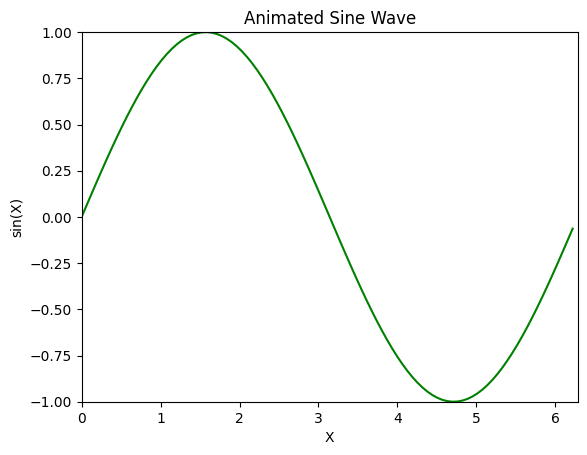

In [5]:
# Data
x = np.linspace(0, 2*np.pi, 100)
y = np.sin(x)

# Figure
fig, ax = plt.subplots()
line, = ax.plot([], [], color='green')

ax.set_xlim(0, 2*np.pi)
ax.set_ylim(-1, 1)
ax.set_xlabel("X")
ax.set_ylabel("sin(X)")
ax.set_title("Animated Sine Wave")

# Animation function
def animate(i):
    line.set_data(x[:i], y[:i])
    return line,

# Create animation
ani = FuncAnimation(fig, animate, frames=len(x), interval=50, blit=True)

# Display in Jupyter
HTML(ani.to_jshtml())

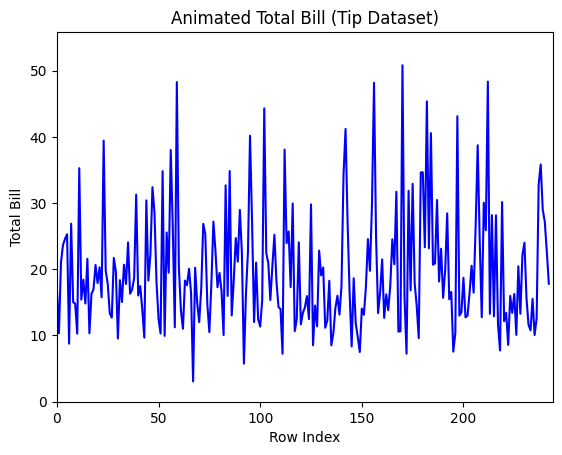

In [6]:


# Load Tip dataset
tips = sns.load_dataset('tips')

# Let's animate total_bill
y = tips['total_bill'].values
x = range(len(y))  # just indices for animation

# Figure
fig, ax = plt.subplots()
line, = ax.plot([], [], color='blue')
ax.set_xlim(0, len(x))
ax.set_ylim(0, y.max()+5)
ax.set_xlabel("Row Index")
ax.set_ylabel("Total Bill")
ax.set_title("Animated Total Bill (Tip Dataset)")

# Animation function
def animate(i):
    line.set_data(x[:i], y[:i])
    return line,

ani = FuncAnimation(fig, animate, frames=len(x), interval=50, blit=True)

# Display in notebook
HTML(ani.to_jshtml())


# using plotly:

In [7]:
import plotly.io as pio
pio.renderers.default = "notebook"  # or "notebook_connected" or "iframe_connected"

# Load data
df = px.data.gapminder()
nepal = df[df['country'] == 'Nepal']

# Create interactive line plot
fig = px.line(nepal, x='year', y='lifeExp', 
              title="Life Expectancy in Nepal (Interactive)", 
              markers=True)  # shows dots
fig.show()

In [8]:
latest_year = df['year'].max()
latest_df = df[df['year'] == latest_year]

# Sort by population and get top 5 countries
top5_countries = latest_df.sort_values(by='pop', ascending=False).head(5)
print(top5_countries[['country', 'pop']])

            country         pop
299           China  1318683096
707           India  1110396331
1619  United States   301139947
719       Indonesia   223547000
179          Brazil   190010647


In [9]:
df['country'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Argentina',
       'Australia', 'Austria', 'Bahrain', 'Bangladesh', 'Belgium',
       'Benin', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon',
       'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
       'Colombia', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Czech Republic',
       'Denmark', 'Djibouti', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Ethiopia',
       'Finland', 'France', 'Gabon', 'Gambia', 'Germany', 'Ghana',
       'Greece', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Haiti',
       'Honduras', 'Hong Kong, China', 'Hungary', 'Iceland', 'India',
       'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy',
       'Jamaica', 'Japan', 'Jordan', 'Kenya', 'Korea, Dem. Rep.',
       'Korea, Rep.', 'Kuwait', 'Leba

In [10]:
fig = px.bar(df[df['country'].isin(['United States','India','China'])],
             x='country', y='pop', color='country',
             animation_frame='year', range_y=[0, 1500000000])
fig.show()

In [11]:
fig = px.bar(
    df[df['country'].isin(['United States','Indonesia','Brazil'])],
    y='country',          # countries on y-axis for horizontal bars
    x='pop',              # population on x-axis
    color='country',
    animation_frame='year',
    range_x=[0, 1500000000],  # adjust x-axis for population
    orientation='h',      # horizontal bar
    title="Population Growth (Horizontal Bar) — United states indonesia and brazil (1952-2007)"
)

fig.show()


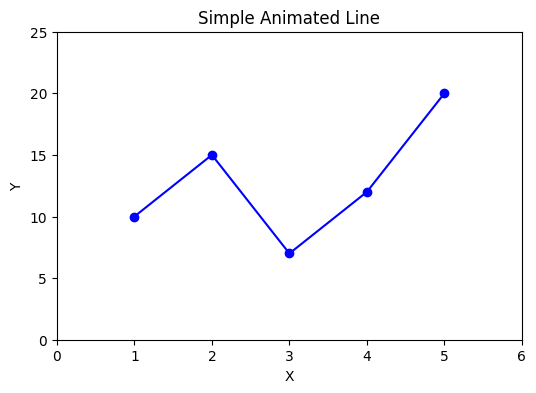

In [12]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML

# -----------------------
# 1. Create simple dataset
# -----------------------
x = np.arange(1, 6)         # X values: 1,2,3,4,5
y = np.array([10, 15, 7, 12, 20])  # Y values

# -----------------------
# 2. Create figure & line
# -----------------------
fig, ax = plt.subplots(figsize=(6,4))
line, = ax.plot([], [], marker='o', color='blue')  # empty line for animation

# Set axes limits and labels
ax.set_xlim(0, 6)
ax.set_ylim(0, 25)
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("Simple Animated Line")

# -----------------------
# 3. Define animation function
# -----------------------
def animate(i):
    # Update line data up to frame i
    line.set_data(x[:i+1], y[:i+1])
    return line,  # must return as tuple

# -----------------------
# 4. Create animation
# -----------------------
ani = FuncAnimation(fig, animate, frames=len(x), interval=500, blit=True)

# -----------------------
# 5a. Display inline in Jupyter
# -----------------------
HTML(ani.to_jshtml())

# -----------------------
# 5b. Save as GIF
# -----------------------
ani.save("simple_animation.gif", writer=PillowWriter(fps=2))

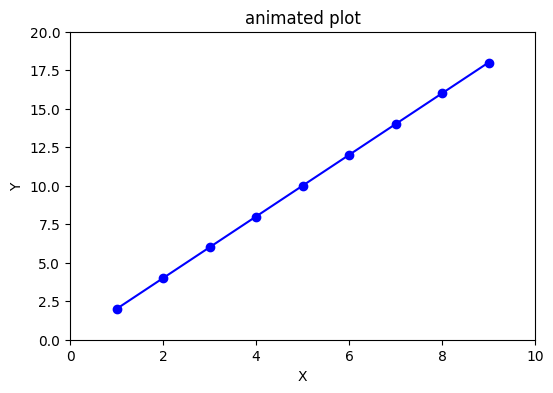

In [13]:
# how to plot with animation using matplotlib:
x=[1,2,3,4,5,6,7,8,9]
y=[2,4,6,8,10,12,14,16,18]

# create subplots:
fig,ax=plt.subplots(figsize=(6,4))
line, =ax.plot([],[],marker='o',color='blue')

ax.set_xlim(0,10)
ax.set_ylim(0,20)
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("animated plot")

def animate(i):
    line.set_data(x[:i+1],y[:i+1])
    return line,

ani=FuncAnimation(fig,animate,frames=len(x),interval=500,blit=True)
HTML(ani.to_jshtml())

In [14]:
# how to draw it using plotly:
x

[1, 2, 3, 4, 5, 6, 7, 8, 9]

In [15]:
y

[2, 4, 6, 8, 10, 12, 14, 16, 18]

In [16]:
x = np.linspace(0, 2*np.pi, 100)
y = np.sin(x)
data=pd.DataFrame({
    'X':x,
    'Y':y,
    'frame':x
})
data

,X,Y,frame
0,0.000000,0.000000e+00,0.000000
1,0.063467,6.342392e-02,0.063467
2,0.126933,1.265925e-01,0.126933
3,0.190400,1.892512e-01,0.190400
4,0.253866,2.511480e-01,0.253866
...,...,...,...
95,6.029319,-2.511480e-01,6.029319
96,6.092786,-1.892512e-01,6.092786
97,6.156252,-1.265925e-01,6.156252
98,6.219719,-6.342392e-02,6.219719


In [17]:
fig=px.line(data,x='X',y='Y',markers=True,animation_frame='frame',range_x=[0,10],range_y=[0,20])
fig.show()

In [18]:
import numpy as np
import pandas as pd
import plotly.express as px

x = np.linspace(0, 2*np.pi, 100)
y = np.sin(x)

# Prepare data for growing line
frames = []
for i in range(1, len(x)+1):
    for j in range(i):
        frames.append({'X': x[j], 'Y': y[j], 'frame': i})

data = pd.DataFrame(frames)

# Plot animated line
fig = px.line(
    data,
    x='X',
    y='Y',
    markers=True,
    animation_frame='frame',
    range_x=[0, 2*np.pi],
    range_y=[-1.2, 1.2],
    title="Growing Sine Wave"
)

fig.show()


In [19]:
import plotly.express as px

# Load Gapminder dataset
df = px.data.gapminder()

# Animated scatter plot: GDP per capita vs Life expectancy
fig = px.scatter(
    df, 
    x="gdpPercap", 
    y="lifeExp",
    size="pop",           # bubble size
    color="continent",
    hover_name="country",
    log_x=True,
    size_max=60,
    animation_frame="year",  # animation over years
    range_x=[100,100000],
    range_y=[20,90],
    title="Gapminder: GDP vs Life Expectancy Over Time"
)

fig.show()
